# Explore signal/price movement relationship

This is an example notebook to explore whether a trading signal results to profitable trades.

- 3 days 
- It explores a small set of pairs on Uni v3 on Polygon
- Both long and short are considered (though shorts might be theoretical only, if such a lending market doest not exist in the point of time)

First run to prepare the dataset:

```shell
python scripts/prepare-polygon-momentum-candles.py
```

In [2]:
import datetime

import pandas as pd

from tradingstrategy.client import Client
from tradingstrategy.chain import ChainId
from tradingstrategy.pair import PandasPairUniverse
from tradingstrategy.timebucket import TimeBucket
from tradeexecutor.utils.default_strategies import get_default_strategies_path
from tradeexecutor.strategy.execution_context import notebook_execution_context
from tradeexecutor.utils.default_strategies import get_default_strategies_path
from tradeexecutor.strategy.strategy_module import read_strategy_module
from tradeexecutor.strategy.trading_strategy_universe import TradingStrategyUniverse, load_partial_data, load_trading_and_lending_data
from tradeexecutor.strategy.universe_model import UniverseOptions

client = Client.create_jupyter_client()

# Load preprocessed candle dataset
# See prepare-polygon-momentum-candles.py   
chain_id = ChainId.polygon
time_bucket = TimeBucket.h1
exchange_slugs = ["uniswap-v3", "quickswap"]
slug_str = "-and-".join(exchange_slugs)
fpath = f"/tmp/{chain_id.get_slug()}-{slug_str}-candles-{time_bucket.value}.parquet"
all_candles_df = pd.read_parquet(fpath)

# Filter out pair ids that belong to our target dataset
exchanges = client.fetch_exchange_universe()
exchange_ids = [exchanges.get_by_chain_and_slug(ChainId.polygon, s).exchange_id for s in exchange_slugs]
pairs_df = client.fetch_pair_universe().to_pandas()
pairs_df = pairs_df.loc[pairs_df["exchange_id"].isin(exchange_ids)]


Started Trading Strategy in Jupyter notebook environment, configuration is stored in /Users/moo/.tradingstrategy


### Interactive viewer mode

Set Plotly chart output mode to interactive viewing.

In [3]:
from tradeexecutor.utils.notebook import OutputMode, setup_charting_and_output

#setup_charting_and_output(OutputMode.interactive, image_format="svg", max_rows=35)
setup_charting_and_output(
    OutputMode.static, 
    image_format="png",
    width=1500,
    height=1200,
    max_rows=30,    
    min_rows=10,
)

## Filter trading pairs

In [4]:
from tradingstrategy.pair import filter_for_stablecoins, StablecoinFilteringMode

good_quote_tokes = {"USDC", "WMATIC"}

# Remove pairs with expensive 1% fee tier
# Remove stable-stable pairs
tradeable_pairs_df = pairs_df.loc[pairs_df["fee"] <= 30]
tradeable_pairs_df = filter_for_stablecoins(tradeable_pairs_df, StablecoinFilteringMode.only_volatile_pairs)
tradeable_pairs_df = tradeable_pairs_df.loc[tradeable_pairs_df["quote_token_symbol"].isin(good_quote_tokes)]

# Denormalise pair ticker symbols on candles DataFrame 
tradeable_pairs_df["ticker"] = tradeable_pairs_df.apply(lambda r: f"{r.base_token_symbol}-{r.quote_token_symbol}-{r.fee}", axis=1)

pair_universe = PandasPairUniverse(tradeable_pairs_df, exchange_universe=exchanges)

# Narrow down candle data to pairs that are left after filtering
eligible_pair_ids = tradeable_pairs_df["pair_id"]
candles_df = all_candles_df.loc[all_candles_df["pair_id"].isin(eligible_pair_ids)].copy()

print(f"We have {len(tradeable_pairs_df)} tradeable pairs our of {len(pairs_df)} total loaded pairs")
print(f"We have {len(candles_df):,} candles for tradeable pairs, out of {len(all_candles_df):,} total candles")

# Denormalise pair data on candles dataframe
# https://stackoverflow.com/questions/62133801/copy-a-column-value-from-another-dataframe-based-on-a-condition
candles_df["timestamp"] = candles_df.index  # Index is lost in merge?
candles_df = candles_df.merge(tradeable_pairs_df[["pair_id", "ticker", "exchange_slug"]], on="pair_id", how="left")
candles_df = candles_df.set_index("timestamp")

We have 3707 tradeable pairs our of 5779 total loaded pairs
We have 17,564,959 candles for tradeable pairs, out of 28,567,384 total candles


## Explore signal vs price change

Create a function `calculate_signal_vs_profit` which calculates 
- Signal (naive momentum)
- Profit: the last and the best future price we can get
- Allows us to play around with different time windows
- Split between shorts and longs


In [5]:
from pandas.tseries.frequencies import to_offset
import humanize

# Set up parameters of time windows
# we use for this notebook run
#lookback_window = pd.Timedelta(days=2)
#profit_window = pd.Timedelta(days=2)


lookback_window = pd.Timedelta(hours=24)
profit_window = pd.Timedelta(hours=24)

long_lookback_window = lookback_window * 4
daily_volume_threshold = 50_000
ma_short = 14
ma_long = 21

min_entries = 14

min_age = pd.DateOffset(days=20)

quantile_sanity_threshold = 0.9995


# Use later in chart titles
signal_window_label = humanize.naturaldelta(lookback_window)
profit_window_label = humanize.naturaldelta(profit_window)




Create a function `calculate_signal_vs_price_for_pair` which calculates 
- Calculates the signal vs. for certain trading pair
- Bundle few different pairs to the same `DataFrame` so we can examine them together


In [6]:
import numpy as np
from pandas.core.groupby import DataFrameGroupBy
from pandas_ta import ema, pvt, obv

from tradingstrategy.pair import DEXPair


def calculate_signal_vs_profit(
    df: pd.DataFrame, 
    pair: DEXPair,
    momentum_window: pd.Timedelta, 
    profit_window: pd.Timedelta,
    time_frame: pd.Timedelta,        
) -> pd.DataFrame:
    """Calculate signals and profits for all incoming candles."""

    number_of_look_back_candles = lookback_window / time_frame
    number_of_look_forward_candles = profit_window / time_frame
    assert number_of_look_forward_candles > 0 and number_of_look_forward_candles.is_integer(), f"Could not calculate candle count that fits into profit window {profit_window} for data time frame {time_frame}"
    assert number_of_look_back_candles > 0 and number_of_look_forward_candles.is_integer(), f"Could not calculate candle count that fits into profit window {lookback_window} for data time frame {time_frame}"
    number_of_look_forward_candles = int(number_of_look_forward_candles)
    number_of_look_back_candles = int(number_of_look_back_candles)

    # Create entries for past price to be used for signal
    # and future price (used for the price correlation)
    momentum_offset = to_offset(lookback_window)
    profit_offset = to_offset(profit_window)

    # No data left after filtering
    if len(df.index) == 0:
        return pd.DataFrame()

    # Calculate trading pair age in a column
    start = df.index[0]

    # Remove first N days of trading history to filter out scam pump and dumps
    df = df.loc[df.index > start + min_age].copy()

    # No data left after filtering
    if len(df) < number_of_look_back_candles:
        return pd.DataFrame()
    
    df["age"] = df.index - start

    # Fix missing prices
    df["open"] = df["open"].replace(0, np.NaN)

    df["prev"] = df["open"].shift(number_of_look_back_candles)
    df["next"] = df["open"].shift(-number_of_look_forward_candles)

    # What is our predicted price
    df["price_diff"] = (df["next"] - df["open"]) / df["open"]  # Get the profit on the final day of profit window

    # Calculate signal from the past and price difference to the future
    df["momentum"] = (df["prev"] - df["open"]) / df["open"]

    #df["shifted_close"] = df["volume"].shift(1).rolling(obv_len).sum()
    #shifted_close = df.rolling(obv_len)
    #assert shifted_close["close"] is not None
    #assert shifted_close["volume"] is not None
    #import ipdb ; ipdb.set_trace()
    df["pvt"] = pvt(df["close"], df["volume"])
    df["obv"] = obv(df["close"], df["volume"])

    #df["obv"] = obv(shifted_close["close"], shifted_close["volume"])
    #shifted = shifted.iloc[-obv_len:-1]
    # df["obv"] = obv(shifted["close"], shifted["volume"])

    # Drop any momentum value that seems to be incorrect (more than 99% price movement)
    df["momentum"] = np.where(df["momentum"] > 0.99, 0, df["momentum"])
    df["momentum"] = np.where(df["momentum"] < -0.99, 0, df["momentum"])
    
    df["ma_long"] = ema(df["open"], length=ma_long) 
    df["ma_short"] = ema(df["open"], length=ma_short)
    
    # Positive difference when current price > short term moving average
    df["ma_diff"] = (df["open"] - df["ma_short"]) / df["open"]

    df["bullish"] = df["ma_diff"] >= 0
    df["bearish"] = df["ma_diff"] < 0

    # df.loc[df["bullish"] & (df["momentum"] >= 0), "signal"] = df["momentum"]
    # df.loc[df["bearish"] & (df["momentum"] < 0), "signal"] = df["momentum"]    
    df["rolling_cum_volume"] = df["volume"].rolling(window=long_lookback_window).sum() 
    df["rolling_obv"] = df["obv"] - df["obv"].shift(periods=number_of_look_back_candles)
    df["rolling_pvt"] = df["pvt"] - df["pvt"].shift(periods=number_of_look_back_candles)
    # df["signal"] = df["rolling_pvt"].shift(1) / df["rolling_cum_volume"].shift(1)
    #df["signal"] = df["rolling_obv"].shift(1) / df["rolling_cum_volume"].shift(1)

    df["signal"] = df["momentum"]
    
    # On negative signals, we go short.
    # On zero signal and lack of data set side to NA
    df["side"] = pd.NA
    
    df.loc[df["signal"] > 0, "side"] = "long"
    df.loc[df["signal"] < 0, "side"] = "short"

    # Max and min price wihtin the profit window will determine the profit for longs and shorts respective
    df["max_future_price"] = df["close"].rolling(number_of_look_forward_candles).max().shift(-number_of_look_forward_candles) # Get the max profit on the profit window, assuming take profit %
    df["min_future_price"] = df["close"].rolling(number_of_look_forward_candles).min().shift(-number_of_look_forward_candles) # Get the max profit on the profit window, assuming take profit %    
    
    df["profit"] = df["price_diff"]
    df["profit_max"] = df["profit"]
    df["profit_abs"] = df["profit_max"].abs()
    # Calculate profit separately for longs and shorts
    # using Pandas Mask
    # https://stackoverflow.com/a/33770421/315168
    #
    # We calculate both profit after X time,
    # and also max take profit, assuming
    # we could do a perfect trailing stop loss
    #
    #longs = (df["side"] == "long")
    #shorts = (df["side"] == "short")
    #df.loc[longs, "profit"] = df["price_diff"]
    #df.loc[shorts, "profit"] = -df["price_diff"]
    #df.loc[longs, "profit_max"] = (df["max_future_price"] - df["open"]) / df["open"]  # Get the profit based on max price
    #df.loc[shorts, "profit_max"] = -(df["min_future_price"] - df["open"]) / df["open"]  # Get the profit based on max price

    #df.loc[longs, "desc"] = df.agg('{0[ticker]} long'.format, axis=1)
    #df.loc[shorts, "desc"] = df.agg('{0[ticker]} short'.format, axis=1)

    df["profit"] = df["profit"].fillna(0)
    df["profit_max"] = df["profit_max"].fillna(0)

    # On too low trading volume we zero out signal
    candle_volume_threshold = daily_volume_threshold * (time_frame / pd.Timedelta(days=1))
    volume_threshold_exceeded = df["volume"] >= candle_volume_threshold
    df["signal"] = np.where(volume_threshold_exceeded, df["signal"], np.NaN)
    df["profit"] = np.where(volume_threshold_exceeded, df["profit"], np.NaN)
    df["profit_max"] = np.where(volume_threshold_exceeded, df["profit_max"], np.NaN)
    
    return df


def calculate_signal_vs_price_for_pair(
    grouped_candles: DataFrameGroupBy,
    pair: DEXPair
) -> pd.DataFrame:
    """Calculate signal vs. profit ratio for an individual pair."""
    try:
        df = grouped_candles.get_group(pair.pair_id).copy()
    except KeyError:
        # Scam pairs 
        return pd.DataFrame()
        
    df = calculate_signal_vs_profit(
        df,
        pair,
        lookback_window,
        profit_window,
        time_frame=time_bucket.to_pandas_timedelta(),
    )
    return df

print("Calculating signals")
grouped_candles = candles_df.groupby("pair_id")
all_pairs = tradeable_pairs_df.groupby("pair_id")
per_pair_data = [calculate_signal_vs_price_for_pair(grouped_candles, pair) for pair in pair_universe.iterate_pairs()]
df = pd.concat(per_pair_data)    

# Fix column order for table rendering
df.insert(0, 'signal', df.pop('signal'))
df.insert(0, 'profit', df.pop('profit'))


print(f"Total signals {len(df):,}")

Calculating signals
Total signals 16,600,212


### Outlier filter

Get rid of abnormally large values caused on scam tokens and other issues in the input data.

In [7]:
# Store for later
unfiltered_df = df

# Run outlier filter
#
# Use separate quantile for high and low because low min is -1.0 lose your all money when the token goes to zero in rug pull
#
# https://stackoverflow.com/questions/23199796/detect-and-exclude-outliers-in-a-pandas-dataframe
q_hi  = df["profit"].quantile(quantile_sanity_threshold)
q_low = df["profit"].quantile(1 - quantile_sanity_threshold)

#q_low = df["profit_max"].quantile(0.01)
#q_hi  = df["profit_max"].quantile(0.99)
df = df[(df["profit"] < q_hi) & (df["profit"] > q_low)]

print(f"Max profit high filtering {quantile_sanity_threshold}, quantile high is {q_hi},  quantile low is {q_low}")
#df = df[df["profit_abs"] < q_hi]

q_hi  = df["signal"].abs().quantile(quantile_sanity_threshold)
#q_low = df["profit_max"].quantile(0.01)
#q_hi  = df["profit_max"].quantile(0.99)
#df_filtered = df[(df["profit_max"] < q_hi) & (df["profit_max"] > q_low)]

#print(f"Max signal high filtering {quantile_sanity_threshold} quantile is {q_hi}")
#df = df[df["signal"].abs() < q_hi]

#price_df = df.sort_values('price_diff', ascending=False).drop_duplicates("timestamp")
#display(price_df)

Max profit high filtering 0.9995, quantile high is 1.4994795322418213,  quantile low is -0.8659203052520752


### Best signal picker


In [8]:
# Find maximum momentum df
profit_df = df.copy()
#profit_df.index = pd.MultiIndex.from_arrays([df.index, df["pair"]])
profit_df["signal"] = profit_df["signal"].fillna(0).replace([np.inf, -np.inf], 0)
profit_df["profit"] = profit_df["profit"].fillna(0).replace([np.inf, -np.inf], 0)
profit_df["profit_max"] = profit_df["profit_max"].fillna(0).replace([np.inf, -np.inf], 0)
profit_df["timestamp"] = profit_df.index
#display(profit_df)

#max_df = df.loc[df.groupby("timestamp")['signal'].idxmax()]
# max_df = df.groupby("timestamp")["profit"].max()
max_df = profit_df.sort_values('signal', key=abs, ascending=False).drop_duplicates("timestamp")
# max_df["signal"] = profit_df["signal"].fillna(0)

max_df = max_df.sort_values("profit", ascending=False)
print(f"Best picked results {len(max_df):,}")
# display(max_df)

#quantile_sanity_threshold = 0.90
#q_hi  = max_df["profit_abs"].quantile(quantile_sanity_threshold)
#print(f"Best profit high filtering {quantile_sanity_threshold} quantile is {q_hi}")
#max_df = max_df[max_df["profit_abs"] < q_hi]
#q_hi  = max_df["signal"].abs().quantile(quantile_sanity_threshold)
#print(f"Best signal high filtering {quantile_sanity_threshold} quantile is {q_hi}")
#max_df = max_df[max_df["signal"].abs() < q_hi]
#print(f"Best picked results, filtered {len(max_df):,}")

display(max_df)

Best picked results 24,793


,profit,signal,pair_id,open,high,low,close,volume,ticker,exchange_slug,age,prev,next,price_diff,momentum,pvt,obv,ma_long,ma_short,ma_diff,bullish,bearish,rolling_cum_volume,rolling_obv,rolling_pvt,side,max_future_price,min_future_price,profit_max,profit_abs,timestamp
timestamp,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2022-06-14 00:00:00,1.497481,0.279732,94370,0.278731,0.307877,0.265857,0.274911,36309.144531,CEL-WMATIC-30,quickswap,458 days 08:00:00,0.356700,0.696125,1.497481,0.279732,4.487405e+06,-3.706153e+04,0.285269,0.283857,-0.018393,False,True,2.117604e+06,6.176345e+04,1.198134e+06,long,0.891776,0.269160,1.497481,1.497481,2022-06-14 00:00:00
2021-10-29 23:00:00,1.480928,-0.363540,93860,1.417651,1.419809,1.370221,1.391989,2930.264404,MANA-WMATIC-30,quickswap,262 days 20:00:00,0.902278,3.517090,1.480928,-0.363540,-8.974463e+05,8.501142e+04,1.222907,1.277649,0.098756,True,False,1.777022e+05,3.741503e+04,3.160718e+05,short,3.516017,1.313387,1.480928,1.480928,2021-10-29 23:00:00
2021-11-02 23:00:00,1.471263,-0.410468,95046,0.066203,0.069873,0.066107,0.068662,4572.002441,Krill-USDC-30,quickswap,193 days 00:00:00,0.039029,0.163606,1.471263,-0.410468,5.262249e+05,-8.947054e+05,0.042358,0.043698,0.339939,True,False,4.319182e+04,2.450456e+04,1.041468e+06,short,0.173485,0.071727,1.471263,1.471263,2021-11-02 23:00:00
2021-12-30 09:00:00,1.470599,-0.638291,2634150,1.903325,1.925795,0.996713,1.493519,22392.246094,SFF-WMATIC-30,quickswap,27 days 11:00:00,0.688450,4.702352,1.470599,-0.638291,4.934896e+06,-5.490961e+04,1.858384,1.970108,-0.035088,False,True,6.305363e+05,-6.504688e+04,4.429417e+06,short,5.055453,1.235762,1.470599,1.470599,2021-12-30 09:00:00
2021-07-03 12:00:00,1.459385,-0.728788,95046,0.614203,0.680186,0.614203,0.629589,27375.498047,Krill-USDC-30,quickswap,70 days 13:00:00,0.166579,1.510562,1.459385,-0.728788,4.231074e+06,-1.534876e+06,0.417686,0.471519,0.232308,True,False,1.154176e+06,4.419945e+05,2.950521e+07,short,1.738488,0.696511,1.459385,1.459385,2021-07-03 12:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-07-12 08:00:00,-0.849286,-0.819753,102973,45.023369,45.023369,16.692757,24.323931,4745.781250,INST-USDC-30,quickswap,25 days 12:00:00,8.115349,6.785645,-0.849286,-0.819753,9.600535e+05,4.590903e+03,11.239172,12.927030,0.712882,True,False,8.452062e+03,4.461786e+03,9.541396e+05,short,9.515649,6.784750,-0.849286,0.849286,2021-07-12 08:00:00
2022-05-10 09:00:00,-0.850165,0.940897,2634932,31.800125,32.382275,29.060574,29.161057,179105.562500,LUNA-USDC-30,quickswap,158 days 09:00:00,61.720753,4.764786,-0.850165,0.940897,-2.162289e+07,-9.061038e+05,40.310157,36.290913,-0.141219,False,True,7.483606e+06,-2.316774e+06,-2.478332e+07,long,33.399025,3.914689,-0.850165,0.850165,2022-05-10 09:00:00
2021-06-18 22:00:00,-0.853961,-0.345538,95046,1.183439,1.228422,1.178540,1.206888,20701.298828,Krill-USDC-30,quickswap,55 days 23:00:00,0.774516,0.172828,-0.853961,-0.345538,-1.474945e+07,-1.472549e+06,1.144577,1.182961,0.000404,True,False,1.948711e+06,2.234632e+05,2.586054e+06,short,0.717413,0.162009,-0.853961,0.853961,2021-06-18 22:00:00


# Example trading pair chart

Plot with our indicators



Lookback 1 days 00:00:00 look forward 1 days 00:00:00


,profit,signal,pair_id,open,high,low,close,volume,ticker,exchange_slug,age,prev,next,price_diff,momentum,pvt,obv,ma_long,ma_short,ma_diff,bullish,bearish,rolling_cum_volume,rolling_obv,rolling_pvt,side,max_future_price,min_future_price,profit_max,profit_abs
timestamp,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2022-07-07 08:00:00,0.05,0.00,2854973,"1,184.94","1,185.65","1,181.51","1,185.53","96,319.72",WETH-USDC-5,uniswap-v3,197 days 13:00:00,"4,002.95","1,239.85",0.05,0.00,"-6,779,321.00","-96,319.72","3,746.77","3,627.22",-2.06,False,True,"96,319.72","-96,319.72","-6,779,321.00",<NA>,"1,260.86","1,183.88",0.05,0.05
2022-07-07 09:00:00,0.03,0.00,2854973,"1,185.53","1,190.29","1,181.51","1,184.35","491,925.34",WETH-USDC-5,uniswap-v3,197 days 14:00:00,"4,002.95","1,216.88",0.03,0.00,"-6,828,483.50","-588,245.06","3,513.93","3,301.66",-1.78,False,True,"588,245.06","-588,245.06","-6,828,483.50",<NA>,"1,260.86","1,183.88",0.03,0.03
2022-07-07 10:00:00,0.03,0.00,2854973,"1,184.23","1,189.69","1,179.62","1,184.47","517,558.12",WETH-USDC-5,uniswap-v3,197 days 15:00:00,"4,002.95","1,216.40",0.03,0.00,"-6,823,309.00","-70,686.94","3,302.14","3,019.34",-1.55,False,True,"1,105,803.19","-70,686.94","-6,823,309.00",<NA>,"1,260.86","1,183.88",0.03,0.03
2022-07-07 11:00:00,0.03,0.00,2854973,"1,184.47","1,184.59","1,178.21","1,183.88","354,032.16",WETH-USDC-5,uniswap-v3,197 days 16:00:00,"4,002.95","1,216.15",0.03,0.00,"-6,841,005.00","-424,719.09","3,109.62","2,774.69",-1.34,False,True,"1,459,835.34","-424,719.09","-6,841,005.00",<NA>,"1,260.86","1,186.25",0.03,0.03
2022-07-07 12:00:00,0.03,0.00,2854973,"1,183.99","1,189.69","1,178.56","1,186.25","874,702.19",WETH-USDC-5,uniswap-v3,197 days 17:00:00,"4,002.95","1,219.68",0.03,0.00,"-6,665,899.00","449,983.09","2,934.57","2,562.60",-1.16,False,True,"2,334,537.53","449,983.09","-6,665,899.00",<NA>,"1,260.86","1,195.53",0.03,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-11-20 06:00:00,0.00,-0.02,2854973,"2,000.04","2,009.46","1,999.44","2,007.25","989,590.00",WETH-USDC-5,uniswap-v3,698 days 11:00:00,"1,958.68",NaN,NaN,-0.02,"-271,192,608.00","-465,899,392.00","1,986.37","1,992.85",0.00,True,False,"67,624,110.79","2,978,560.00","2,912,416.00",short,NaN,NaN,0.00,NaN
2023-11-20 07:00:00,0.00,-0.02,2854973,"2,007.65","2,020.75","2,002.44","2,019.94","539,419.19",WETH-USDC-5,uniswap-v3,698 days 12:00:00,"1,964.56",NaN,NaN,-0.02,"-270,851,712.00","-465,359,968.00","1,988.30","1,994.82",0.01,True,False,"67,693,175.63","3,649,664.00","3,263,840.00",short,NaN,NaN,0.00,NaN
2023-11-20 08:00:00,0.00,-0.03,2854973,"2,020.14","2,021.55","2,010.87","2,017.31","645,412.94",WETH-USDC-5,uniswap-v3,698 days 13:00:00,"1,962.99",NaN,NaN,-0.03,"-270,935,552.00","-466,005,376.00","1,991.20","1,998.20",0.01,True,False,"67,754,821.45","3,158,016.00","3,201,504.00",short,NaN,NaN,0.00,NaN


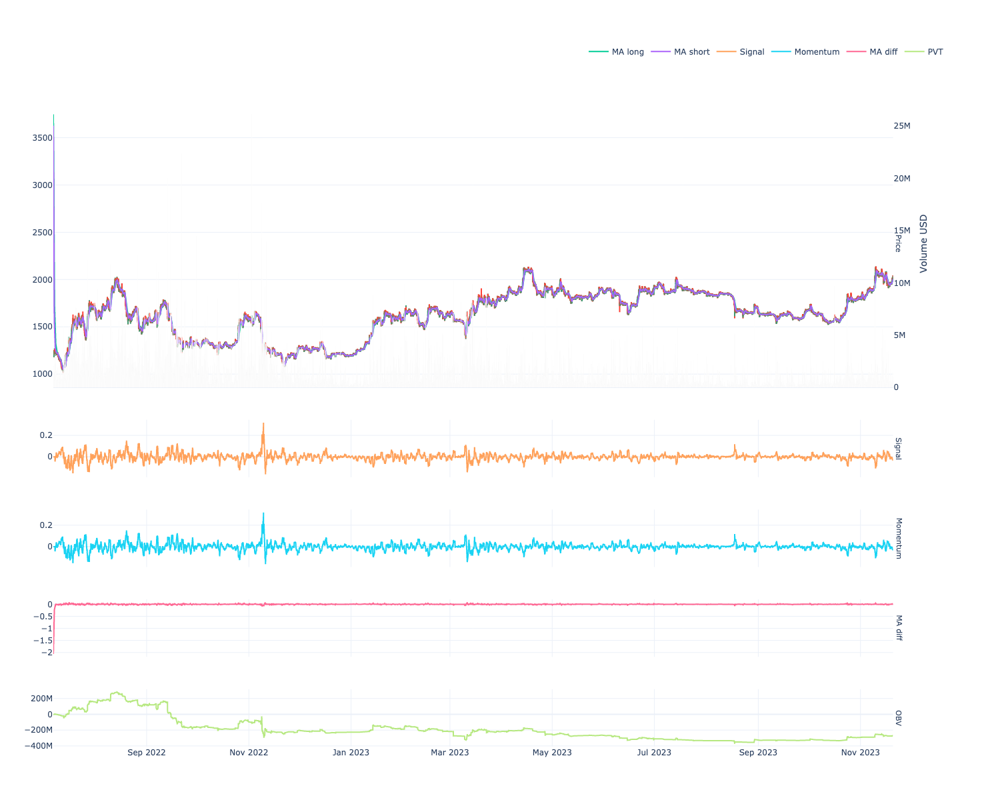

In [9]:
import plotly.express as px
import plotly.graph_objects as go

from tradingstrategy.charting.candle_chart import visualise_ohlcv

# Pick single pair to examine
# The first pair is ETH-USD
examined_pair = pair_universe.get_pair_by_human_description((ChainId.polygon, "uniswap-v3", "WETH", "USDC", 0.0005))
#examined_pair = pair_universe.get_pair_by_human_description((ChainId.polygon, "quickswap", "pSWAMP", "WMATIC"))
single_df = df.loc[df["pair_id"] == examined_pair.pair_id]

#pd.set_option('display.float_format', lambda x: '%.2f' % x)
pd.options.display.float_format = '{:,.2f}'.format

print("Lookback", lookback_window, "look forward", profit_window)
display(single_df)

fig = visualise_ohlcv(
    single_df,
    num_detached_indicators=4,
    subplot_names=["Price", "Signal", "Momentum", "MA diff", "OBV"],
)

fig.add_trace(
    go.Scatter(name="MA long", x=single_df.index, y=single_df["ma_long"]),
    row=1,
    col=1,
)

fig.add_trace(
    go.Scatter(name="MA short", x=single_df.index, y=single_df["ma_short"]),
    row=1,
    col=1,
)


fig.add_trace(
    go.Scatter(name="Signal", x=single_df.index, y=single_df["signal"]),
    row=2,
    col=1,
)

fig.add_trace(
    go.Scatter(name="Momentum", x=single_df.index, y=single_df["momentum"]),
    row=3,
    col=1,
)

fig.add_trace(
    go.Scatter(name="MA diff", x=single_df.index, y=single_df["ma_diff"]),
    row=4,
    col=1,
)

fig.add_trace(
    go.Scatter(name="PVT", x=single_df.index, y=single_df["pvt"]),
    row=5,
    col=1,
)

fig.show()

# display(single_df)

## Plot signal vs. price samples

Different scatter charts to examine if there is a correlation between the signal and the profit.

### Best signal picks

- For each time frame, pick the strongest signal

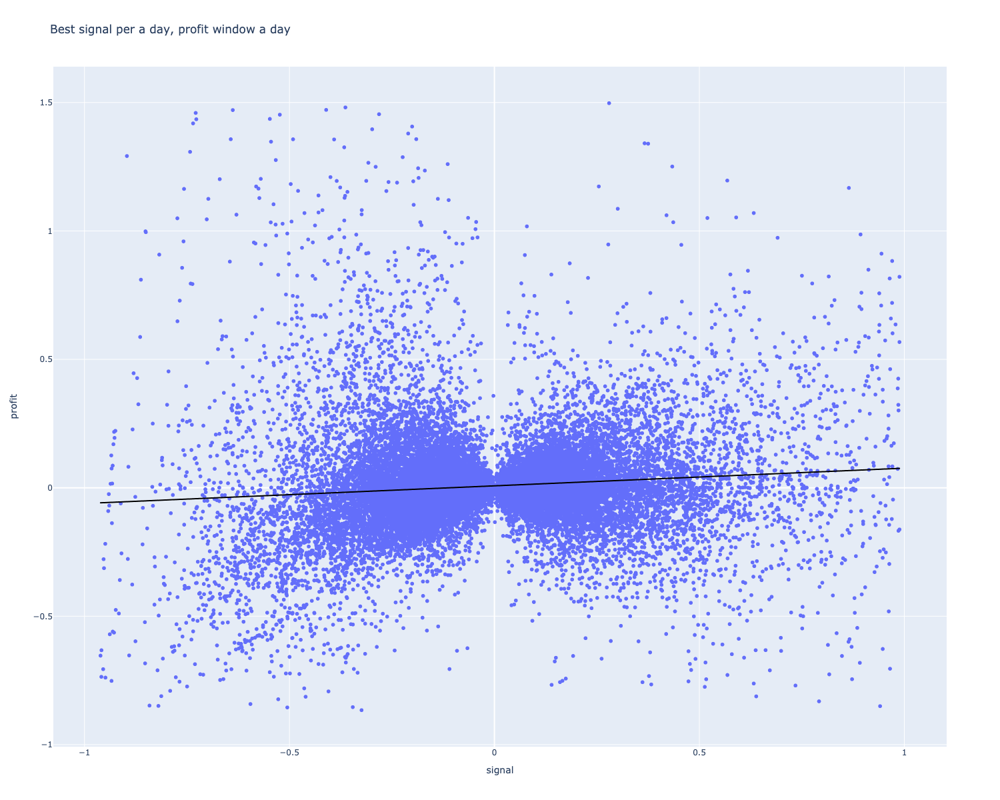

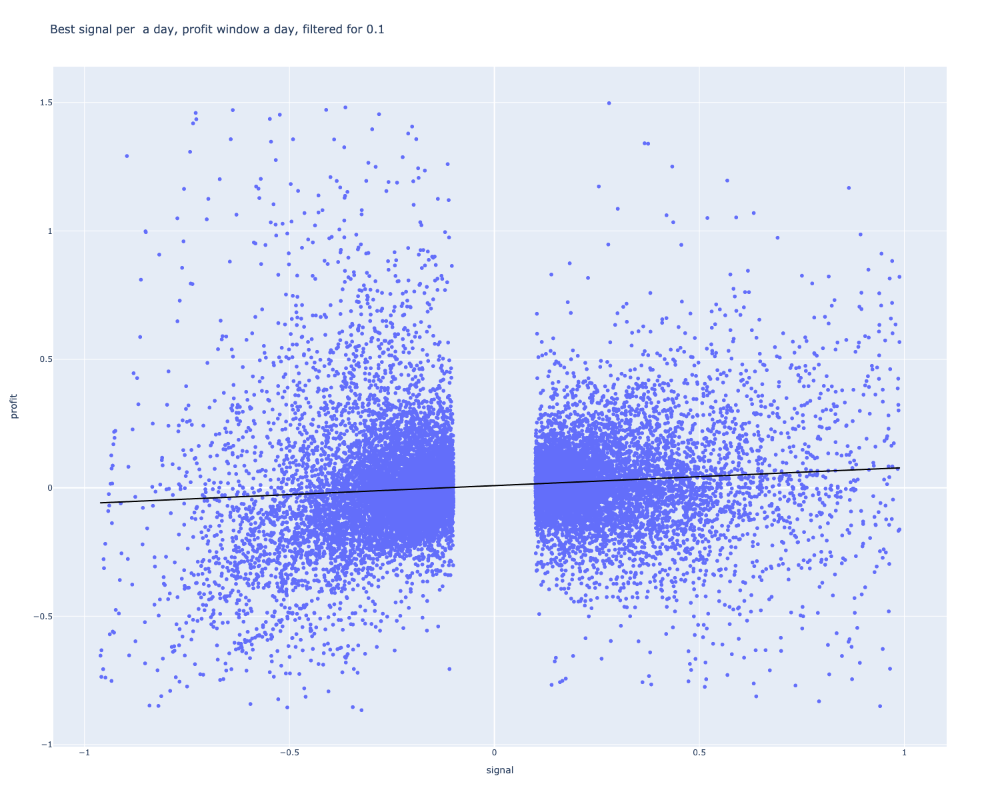

In [19]:

signal_threshold = 0.10

fig = px.scatter(
    max_df, 
    x="signal", 
    y="profit", 
    trendline="ols", 
    title=f"Best signal per {signal_window_label}, profit window {profit_window_label}",
    trendline_color_override="black"
    #marginal_x="histogram", 
    #marginal_y="rug"    
)
fig.update_layout(legend=dict(title='Pair and direction'))
fig.show()

filtered_max_df = max_df[max_df["signal"].abs() >= signal_threshold]
fig = px.scatter(
    filtered_max_df, 
    x="signal", 
    y="profit", 
    trendline="ols", 
    title=f"Best signal per  {signal_window_label}, profit window {profit_window_label}, filtered for {signal_threshold}",
    trendline_color_override="black"
    #marginal_x="histogram", 
    #marginal_y="rug"    
)
fig.update_layout(legend=dict(title='Pair and direction'))
fig.show()


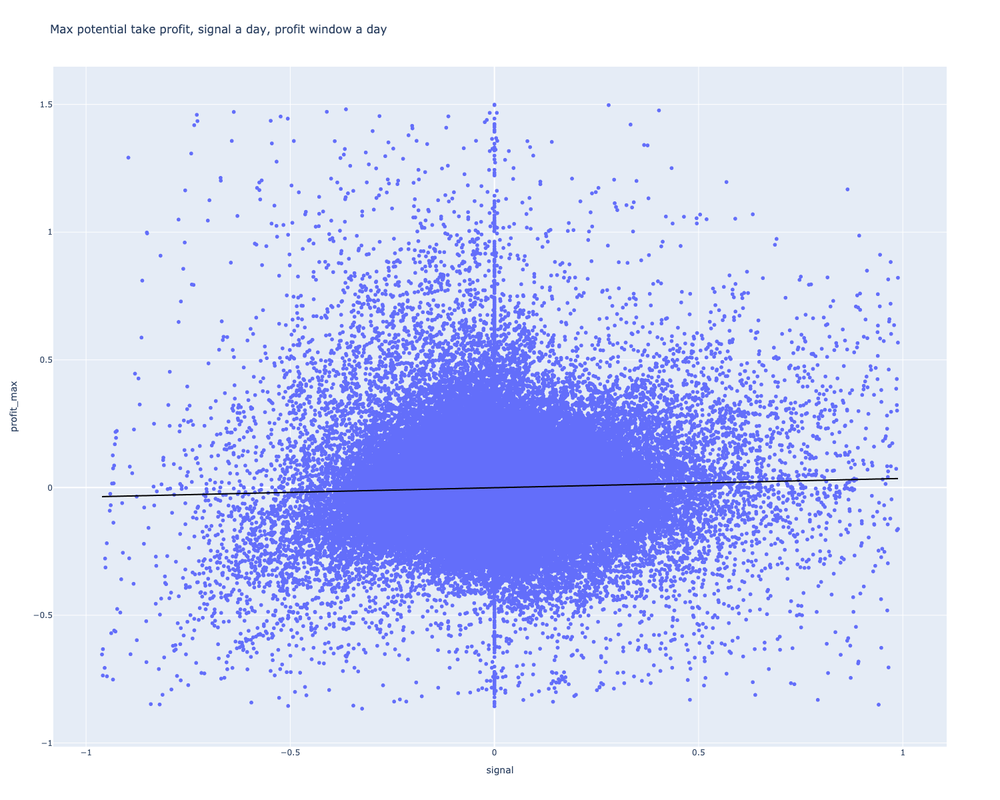

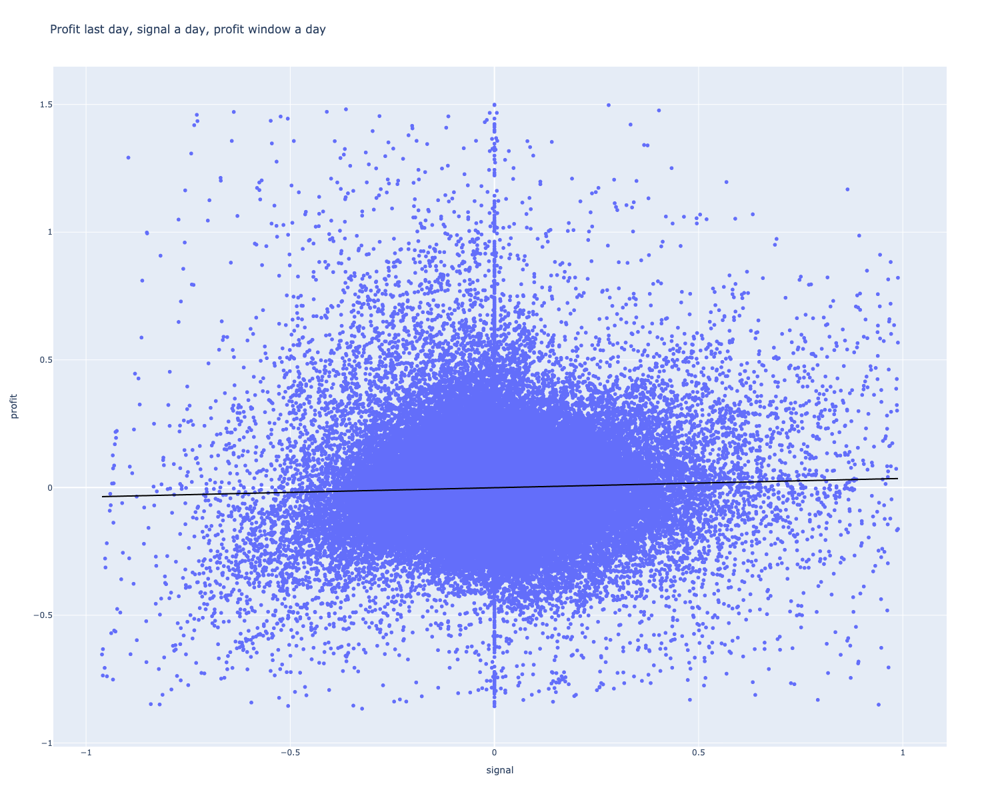

In [11]:

#display(df)
#display(max_df)

fig = px.scatter(
    df, 
    x="signal", 
    y="profit_max", 
    trendline="ols", 
    # color="desc", 
    title=f"Max potential take profit, signal {signal_window_label}, profit window {profit_window_label}",
    #marginal_x="histogram", 
    #marginal_y="rug"
    trendline_color_override="black"
)
fig.update_layout(legend=dict(title='Pair and direction'))
fig.show()

fig = px.scatter(
    df, 
    x="signal", 
    y="profit", 
    trendline="ols", 
    title=f"Profit last day, signal {signal_window_label}, profit window {profit_window_label}",
    trendline_color_override="black"
    #marginal_x="histogram", 
    #marginal_y="rug"    
)
fig.update_layout(legend=dict(title='Pair and direction'))
fig.show()



### Long only vs. short 

Examine trade types separately to better see if one side is clearly superior.

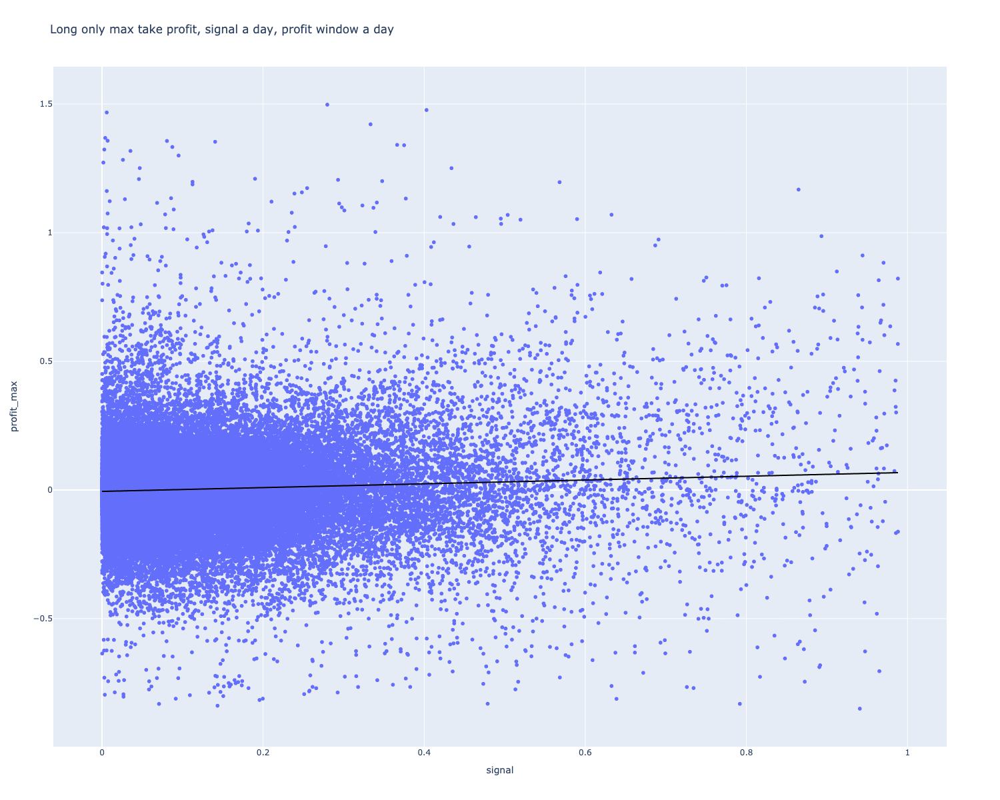

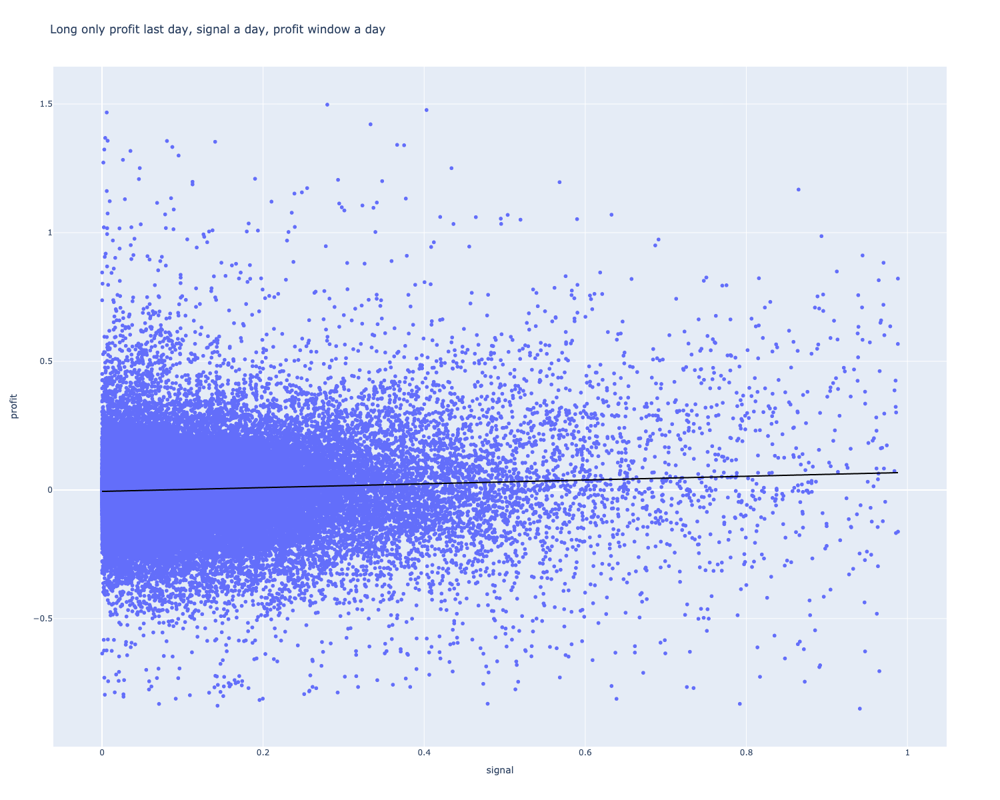

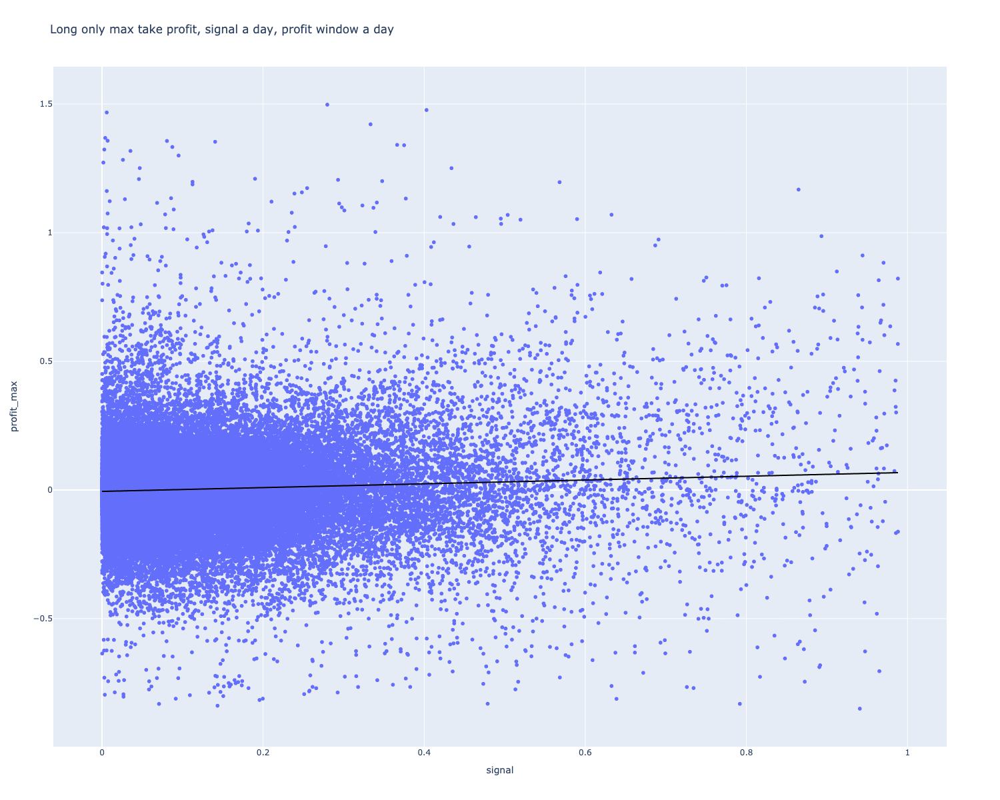

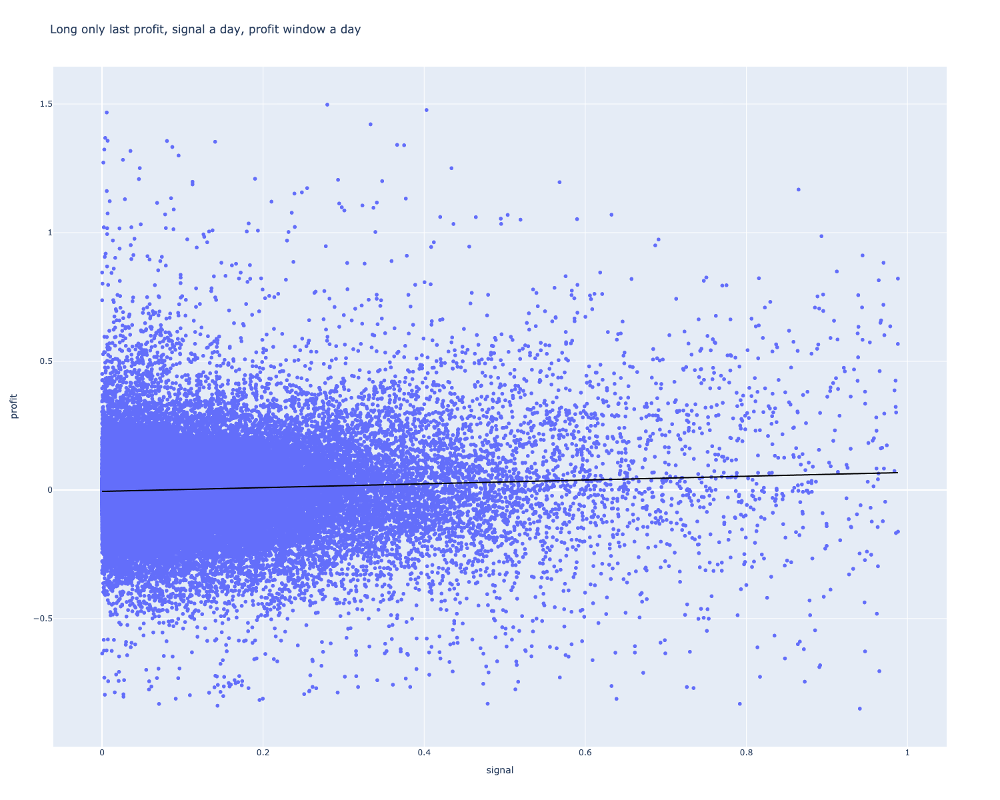

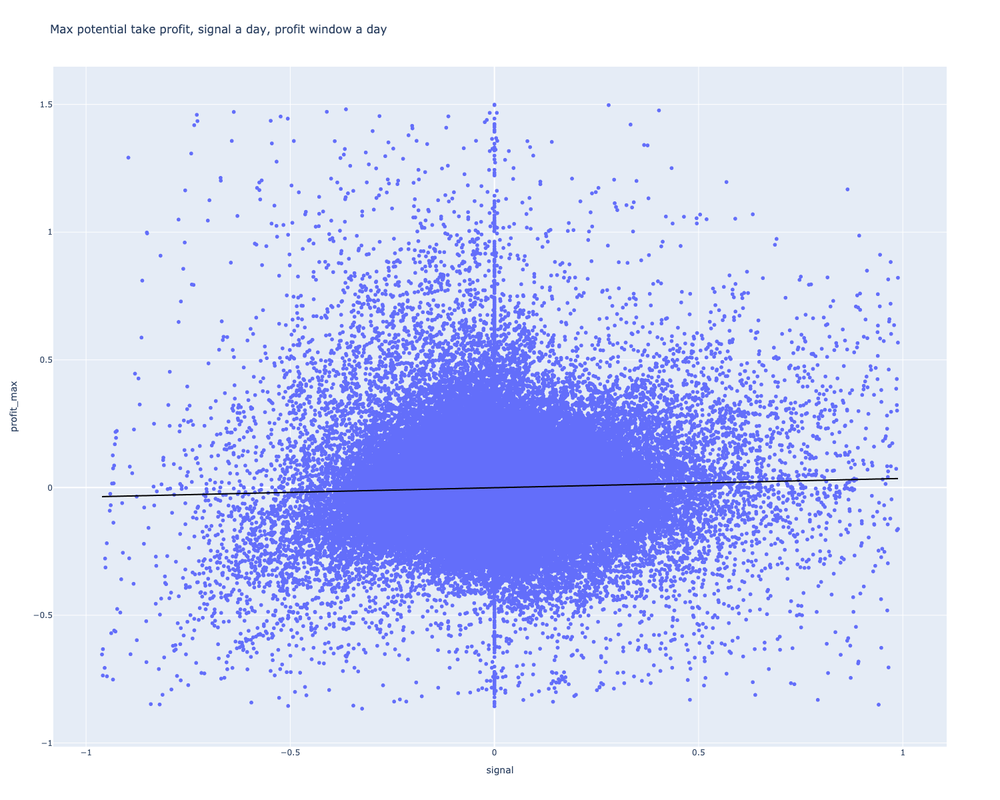

In [12]:
df_long_only = df.loc[df["side"] == "long"]

fig = px.scatter(
    df_long_only, 
    x="signal", 
    y="profit_max", 
    trendline="ols", 
    # color="desc", 
    trendline_color_override="black", 
    title=f"Long only max take profit, signal {signal_window_label}, profit window {profit_window_label}",

)
fig.show()

fig = px.scatter(
    df_long_only, 
    x="signal", 
    y="profit", 
    trendline="ols", 
    trendline_color_override="black", 
    title=f"Long only profit last day, signal {signal_window_label}, profit window {profit_window_label}"
)
fig.show()

fig = px.scatter(
    df_long_only, 
    x="signal", 
    y="profit_max", 
    trendline="ols", 
    trendline_color_override="black", 
    title=f"Long only max take profit, signal {signal_window_label}, profit window {profit_window_label}"
)
fig.show()

fig = px.scatter(
    df_long_only, 
    x="signal", 
    y="profit", 
    trendline="ols", 
    trendline_color_override="black", 
    title=f"Long only last profit, signal {signal_window_label}, profit window {profit_window_label}"
)
fig.show()


fig = px.scatter(
    df, 
    x="signal", 
    y="profit_max", 
    trendline="ols", 
    # color="desc", 
    title=f"Max potential take profit, signal {signal_window_label}, profit window {profit_window_label}",
    #marginal_x="histogram", 
    #marginal_y="rug"
    trendline_color_override="black"
)
fig.update_layout(legend=dict(title='Pair and direction'))
fig.show()



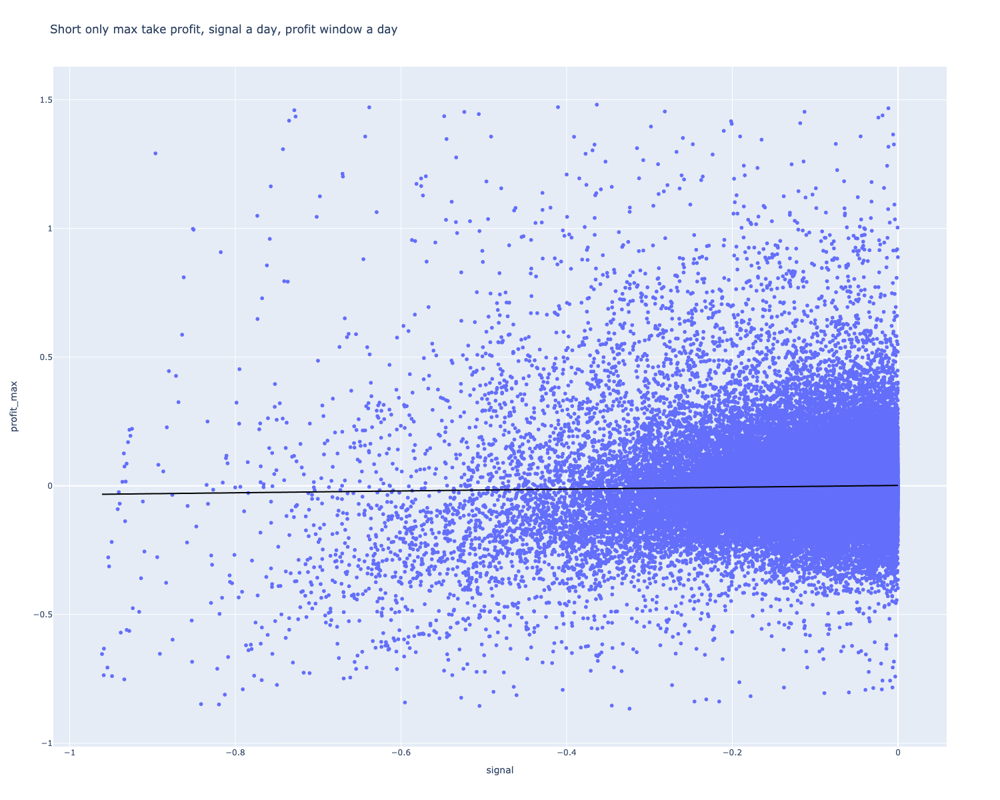

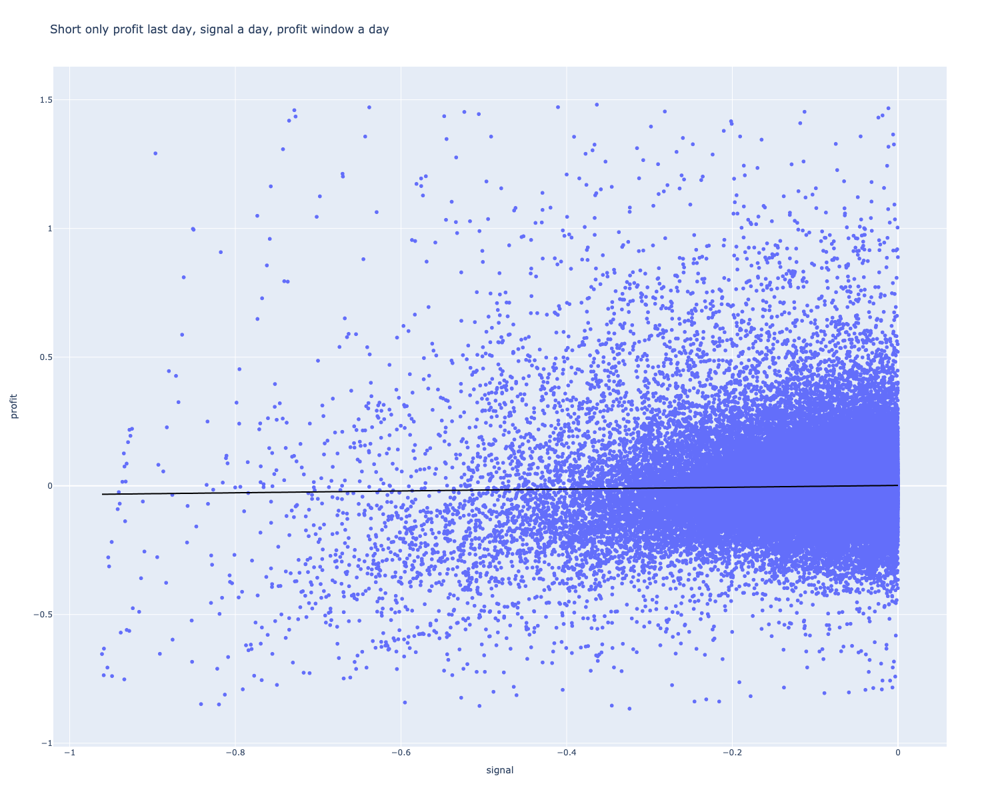

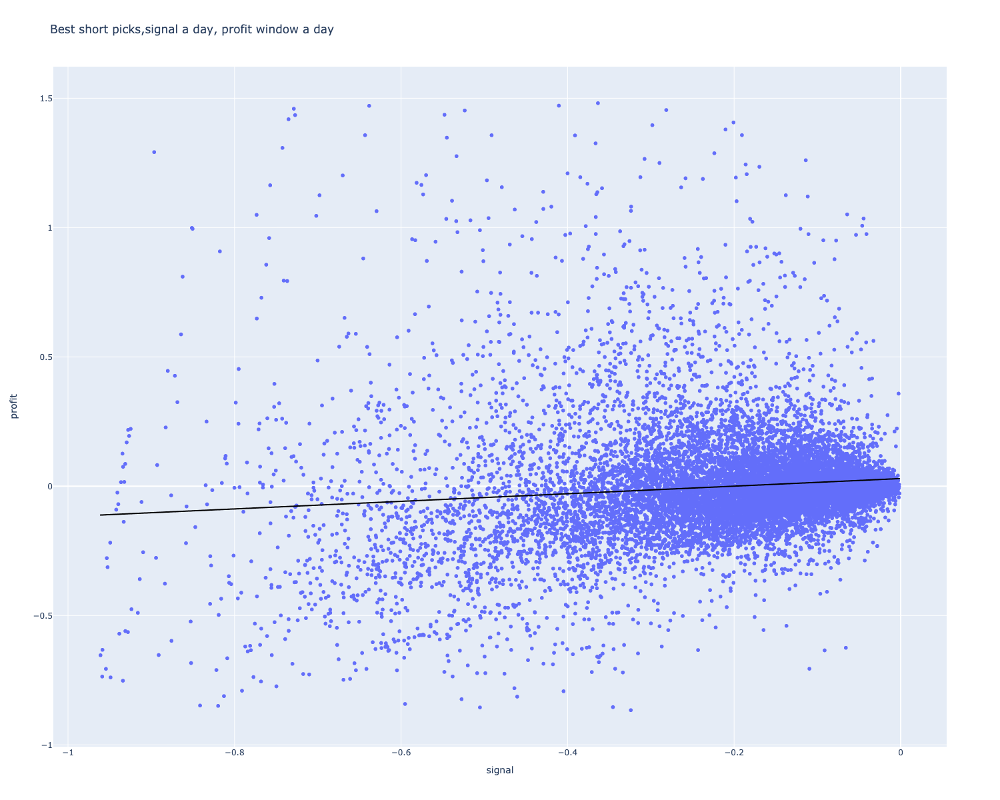

In [13]:
df_short_only = df.loc[df["side"] == "short"]

max_df_short_only = max_df.loc[max_df["side"] == "short"]

fig = px.scatter(
    df_short_only, 
    x="signal", 
    y="profit_max", 
    trendline="ols", 
    title=f"Short only max take profit, signal {signal_window_label}, profit window {profit_window_label}",
    trendline_color_override="black",
)
fig.show()

fig = px.scatter(
    df_short_only, 
    x="signal", 
    y="profit", 
    trendline="ols",     
    title=f"Short only profit last day, signal {signal_window_label}, profit window {profit_window_label}",
    trendline_color_override="black",
)
fig.show()

fig = px.scatter(
    max_df_short_only, 
    x="signal", 
    y="profit", 
    trendline="ols",     
    title=f"Best short picks,signal {signal_window_label}, profit window {profit_window_label}",
    trendline_color_override="black",
)
fig.show()

### Filtered signal

Remove low signals below a certain threshold and see if it affects the correlation between the signal and the profit.

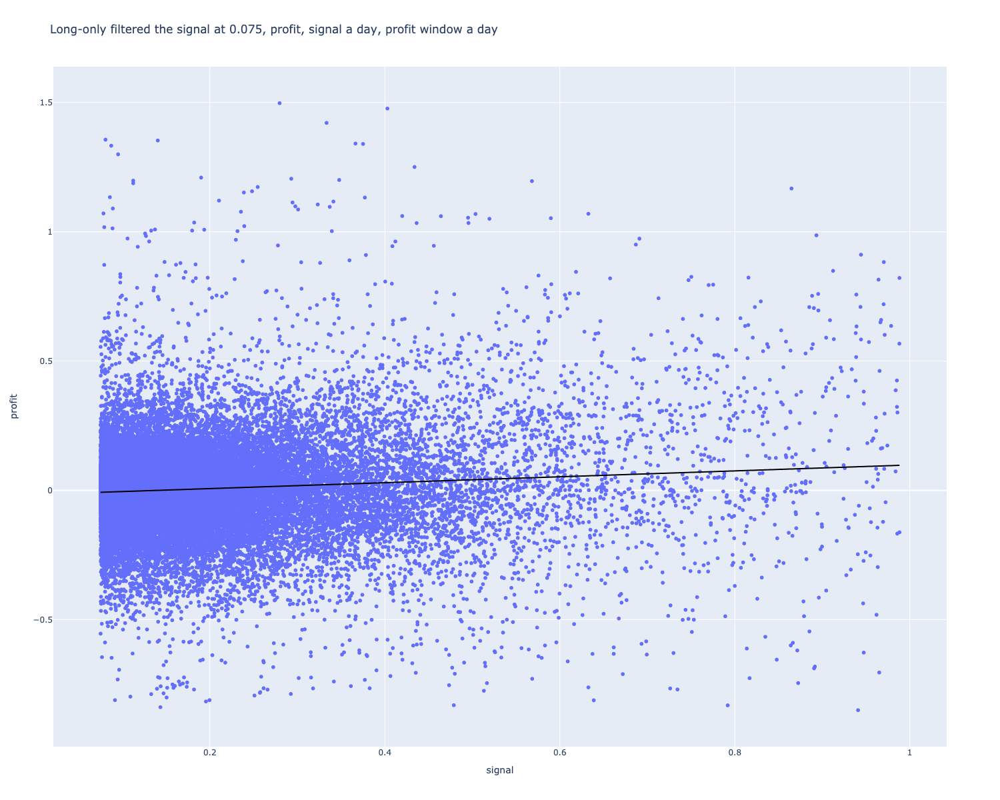

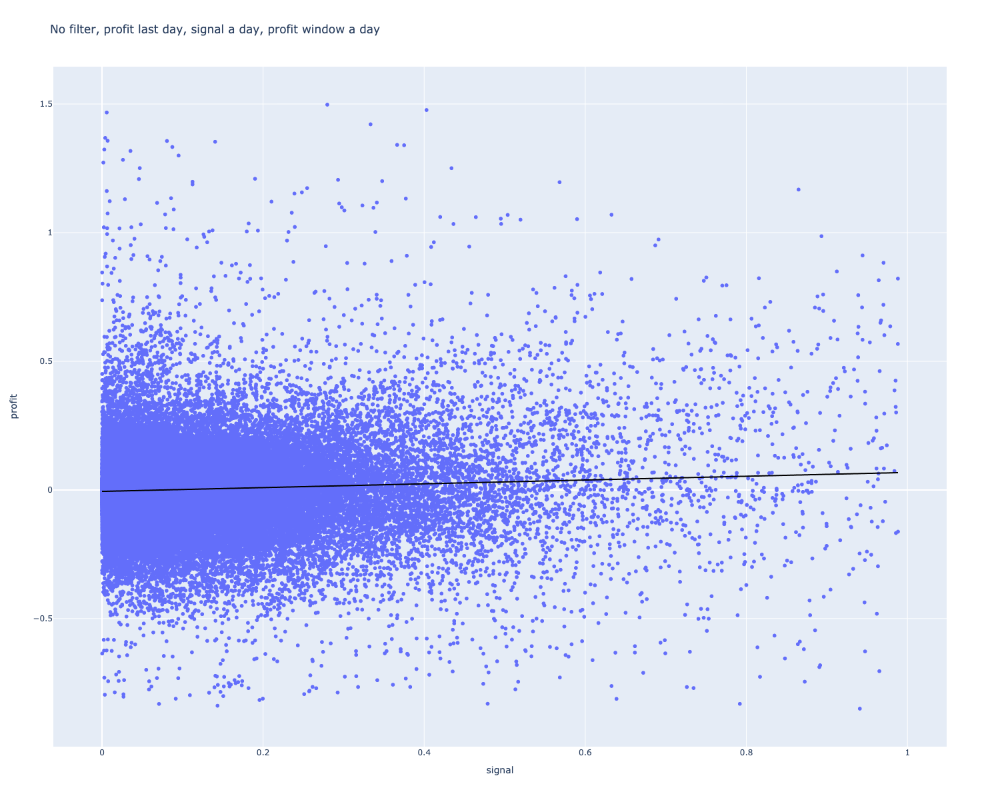

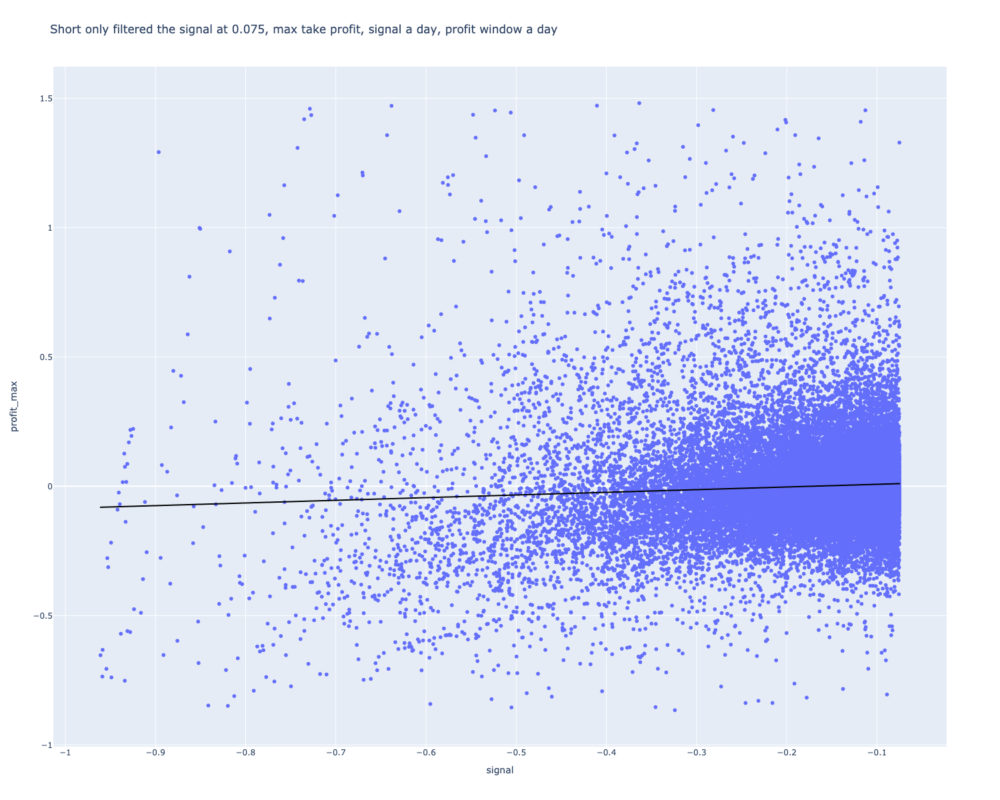

In [14]:

threshold = 0.075

filtered_df = df_long_only.loc[abs(df_long_only["signal"]) >= threshold]

fig = px.scatter(
    filtered_df, 
    x="signal", 
    y="profit", 
    trendline="ols", 
    trendline_color_override="black", 
    title=f"Long-only filtered the signal at {threshold}, profit, signal {signal_window_label}, profit window {profit_window_label}"
)
fig.show()

fig = px.scatter(
    df_long_only, 
    x="signal", 
    y="profit", 
    trendline="ols", 
    trendline_color_override="black", 
    title=f"No filter, profit last day, signal {signal_window_label}, profit window {profit_window_label}")
fig.show()

filtered_df = df_short_only.loc[abs(df_short_only["signal"]) >= threshold]

fig = px.scatter(
    filtered_df, 
    x="signal", 
    y="profit_max", 
    trendline="ols", 
    trendline_color_override="black", 
    title=f"Short only filtered the signal at {threshold}, max take profit, signal {signal_window_label}, profit window {profit_window_label}"
)
fig.show()


## Heatmap

Invidual point cloud is hard to interpret, so render it as a heatmap instead.

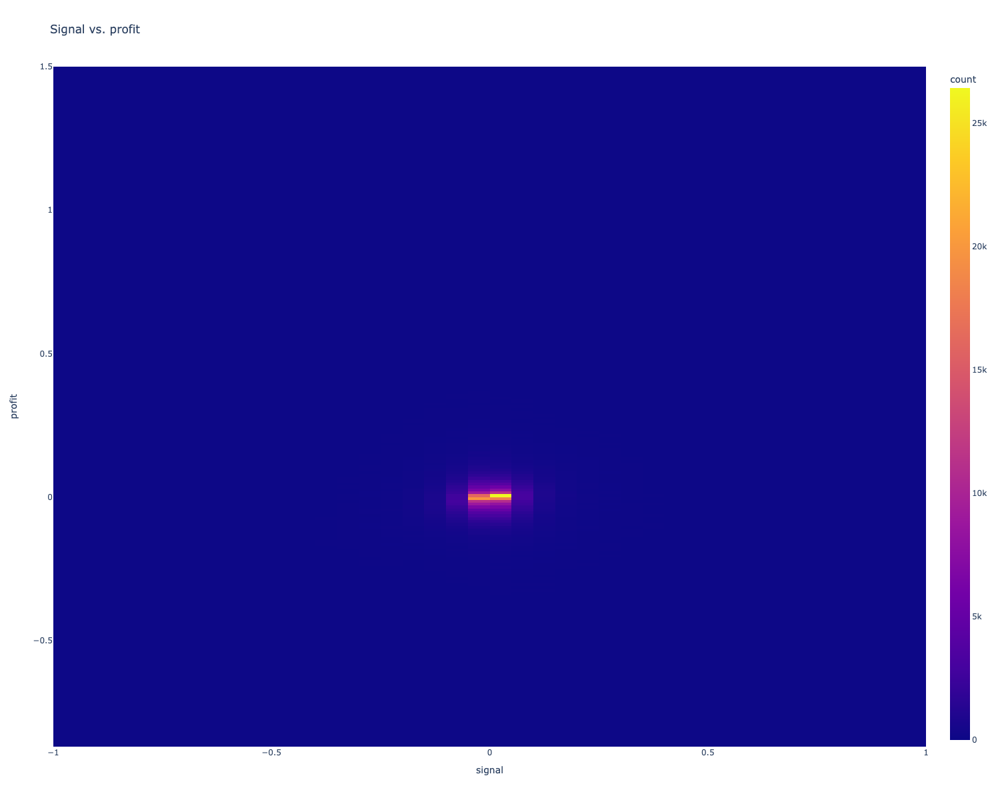

In [15]:

#clipped_df = df.loc[abs(df["signal"]) < 0.2]

fig = px.density_heatmap(
    df, 
    x="signal", 
    y="profit", 
    nbinsx=50, 
    title="Signal vs. profit"

)
fig.show()

#weth = df.loc[df["pair"] == "WETH-UDSC long"]
#fig = px.density_heatmap(df, x="signal", y="profit_max", nbinsx=30, title="WETH")
#fig.show()

## Hexbin plot

Try to make more sense from the point cloud.

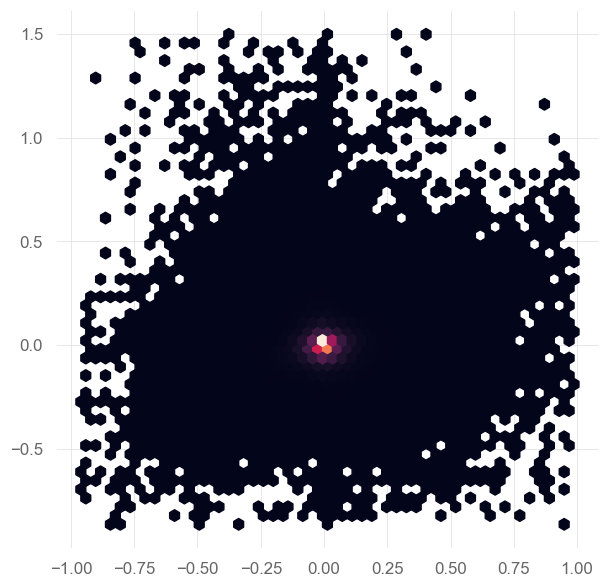

In [16]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
#import cmocean#  http://matplotlib.org/cmocean/

plt.figure(figsize=(7, 7))
ax = plt.hexbin(df["signal"], df["profit"], gridsize=50, mincnt=1) # cmocean.cm.algae is a cmocean colormap
# plt.set_title("Signal vs. Price matches")
plt.show()
# display(df)